In [1]:
import numpy as np
import pandas as pd
import plotly.express as px
pd.options.plotting.backend = "plotly"

import sys
sys.path.append('/home/jovyan/work/cloudsimulation/')
from belimo.cloudsimulation.simulations.simulation import Simulation

In [2]:
env = 'belimo.cloudsimulation.environment.{Module}.{Class}'

elements = {
    env.format(Module='heat_source', Class='HeatSource'): dict(),
    env.format(Module='setpoint_source', Class='SetpointSource'): dict(
        setpoint_level=0.5,
        setpoint_amplitude=0.5,
        setpoint_frequency=1/1800),
    env.format(Module='pump', Class='Pump'): dict(),
    env.format(Module='pipe_delay', Class='PipeDelay'): dict(pipe_delay=20),
    env.format(Module='heat_exchanger', Class='HeatExchanger'): dict(
        dt_max=12.0,
        dt_min=2.0,
        noise_level=0.1),
    env.format(Module='pipe_delay', Class='PipeDelay'): dict(pipe_delay=10),
    'belimo.cloudsimulation.devices.energyvalve.EnergyValve': dict(
        cloud_connected=True,
        device_id="1ba6251a-380d-4f32-9a75-5954aae4b737",
        certificate_file="/home/jovyan/work/cloudsimulation/notebooks/device_11.pem",
        cloud_endpoint="https://connect.uat.g2bcc.com",
        debug=True),
    env.format(Module='valve_actuator', Class='ValveActuator'): dict(),
}

cfg = dict(
    timestep=1.0,
    elements=elements,
    ic=dict(
        relative_flow=0.0,
        flow=0.0,
        valve_position=0.0,
        valve_setpoint=0.0))

import yaml

with open('config.yaml', 'w') as _f:
    yaml.dump(cfg, _f, yaml.SafeDumper)

In [3]:
simulation = Simulation(**cfg)

In [4]:
runtime_hours = 5
steps = runtime_hours * 60 * 60
states = []

for _ in range(0, steps):
    simulation.run_simulation()
    states.append(simulation.state)

Current time: 0.0
Reporting interval: 30
About to send {'sendtime': 1661431711683, 'samples': [{'timestamp': 1661431711683, 'data': {'f4tkRaHd.7': 1, 'SetSiteName': '', 'SetProjecName': 'TestDevice', 'SetPlantIdentificationCode': 0, 'SetCloudDatalogSampleInterval': 30, 'SetCloudDatalogSendInterval': 300, 'SetBuildingArea': '', 'SetBuildingFloor': '', 'SetBuildingName': '', 'SetBuildingPart': '', 'SetAddressCity': 'Hinwil', 'SetAddressCountry': 'CH', 'SetAddressNameLine1': 'Brunnenbachstrasse 1', 'SetAddressState': 'ZH', 'SetAddressZipCode': '8340', 'OcWebUnitSettings': 'default/Power:kilowatt,                 default/WaterFlow:cubicMetrePerHour,                 default/Temperature:celsius,                 default/Energy:kilowattHour', 'OemString': 'My OEM name', 'CloudConnected': True, 'CloudPatchAvailable': False, 'ApplyCloudPatches': True, 'DeviceBelimoString': 'EV050R2+MID', 'DeviceMpAddress': 0, 'DeviceMpSerialNumber': '22126-10004-022-182', 'DifferentialWaterTemperatureSetpoint': 

In [13]:
t = [4, 56, 67, 1]
t[-1:]

[1]

In [5]:
df = pd.DataFrame(states)

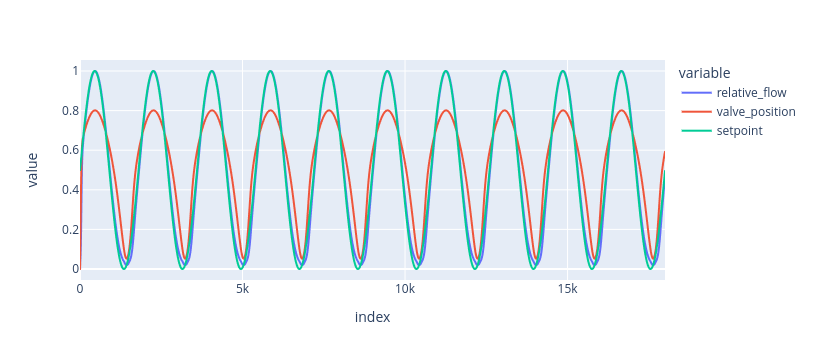

In [6]:
df[['relative_flow', 'valve_position', 'setpoint']].plot()

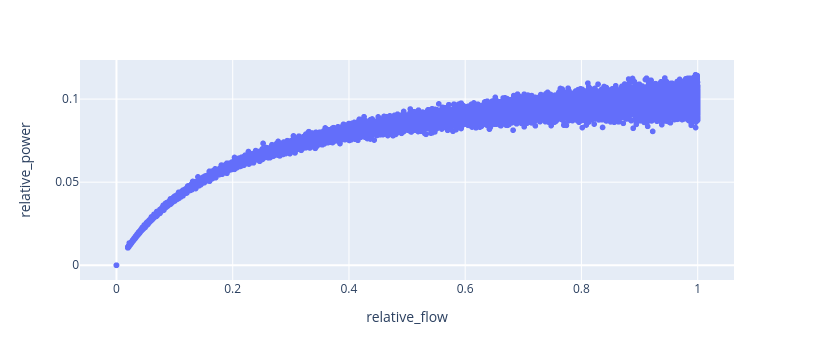

In [7]:
df.plot.scatter(x='relative_flow', y='relative_power')

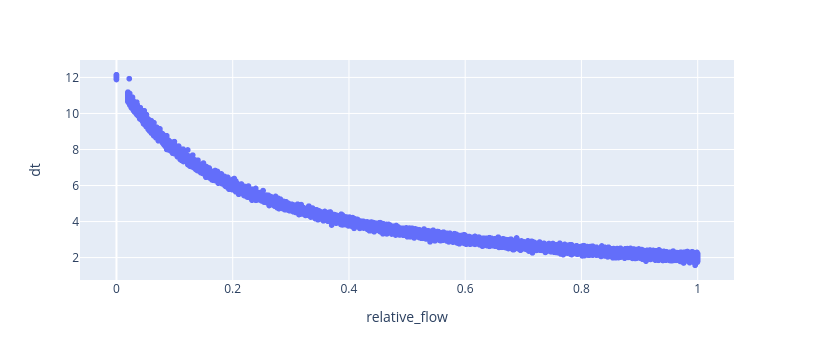

In [8]:
df.plot.scatter(x='relative_flow', y='dt')

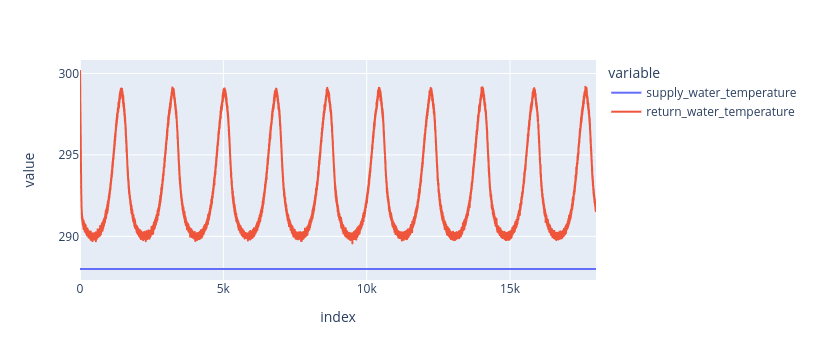

In [9]:
df[['supply_water_temperature', 'return_water_temperature']].plot()

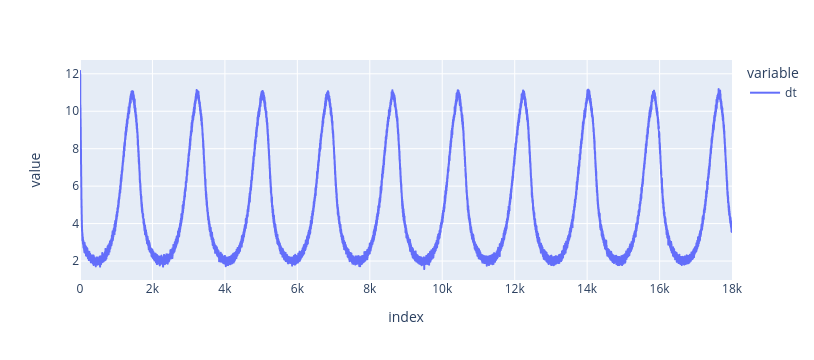

In [10]:
df[['dt']].plot()